<h1 style= "text-align: center"> Region Growing Segmentation </h1>

Libraries used:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import sys
sys.path.append(os.path.abspath(os.path.join('..')))
from Border_detection.border_detection import canny_bordering as canny

Functions used:

In [2]:
# Auto seed selection
def auto_seed_selection(image):
    # Using canny edge detector to find the edges
    edges = canny(image)
    seeds = np.column_stack(np.where(edges == 255))
    return seeds

# Show seeds in the image
def show_seeds(image, seed_points):
    new_image = np.copy(image)
    for p in seed_points:
        new_image[p[0], p[1]] = [240, 30, 160]
    return new_image

# Region growth algorithm
def region_growth(image, seeds, condition):
    # Create a matrix that will contain the segmented region
    region_matrix = np.zeros(image.shape[:2], dtype=np.uint8)

    # Mark all seed points with 255
    region_matrix[tuple(seeds.T)] = 255

    # Define neighborhood offsets
    offsets = np.array([[-1, -1], [-1, 0], [-1, 1],
                         [0, -1], [0, 1],
                         [1, -1], [1, 0], [1, 1]])

    while True:
        new_seeds = []

        # Iterate over current seeds
        for seed in seeds:
            for offset in offsets:
                neighbor = seed + offset
                if 0 <= neighbor[0] < image.shape[0] and 0 <= neighbor[1] < image.shape[1]:
                    if region_matrix[neighbor[0], neighbor[1]] == 0 and np.all(np.abs(image[seed[0], seed[1]] - image[neighbor[0], neighbor[1]]) <= condition):
                        region_matrix[neighbor[0], neighbor[1]] = 255
                        new_seeds.append(neighbor)

        if not new_seeds:
            break

        seeds = np.array(new_seeds)
    
    region_matrix = 255 - region_matrix
    
    return region_matrix

<h1 style= "text-align: center"> MRI</h1>

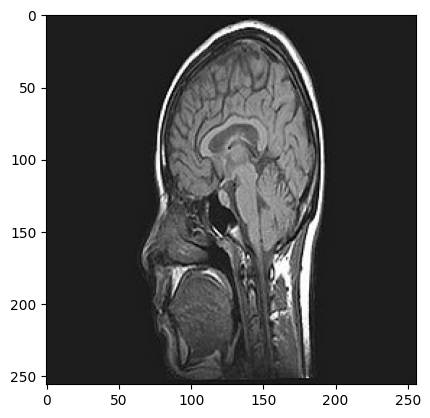

In [3]:
# Load the image
mri = cv2.imread('../Images/mri.jpg')

# Change color to RGB (from BGR)
mri = cv2.cvtColor(mri, cv2.COLOR_BGR2RGB)

plt.imshow(mri)
plt.show()

Seed selection: automatic (using borders-canny)

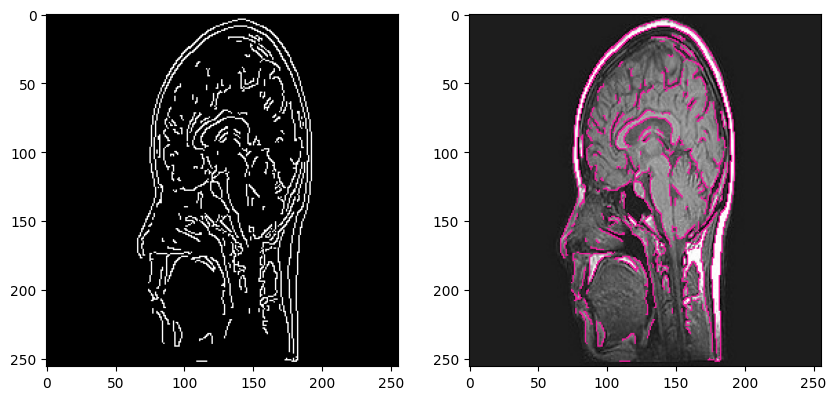

In [4]:
# Create seeds automatically
seed_points_mri = auto_seed_selection(mri)

# Fill the seeds with 1
seed_mri = np.zeros(mri.shape[:2])
# Set the value of the seeds to 1
for p in seed_points_mri:
    seed_mri[p[0], p[1]] = 1

# Shows the seeds in the image 
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(seed_mri, cmap='gray')
plt.subplot(122)
plt.imshow(show_seeds(mri, seed_points_mri))
plt.show()


RESULTS (ALL POSSIBLES RESULTS ARE SHOWN):

Condition: 10


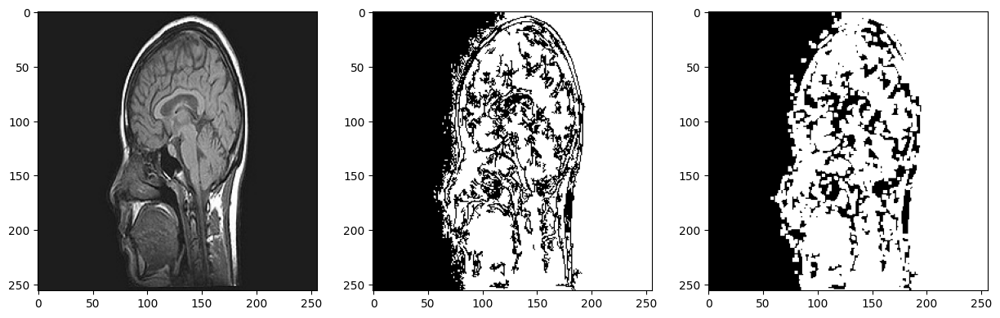

Condition: 20


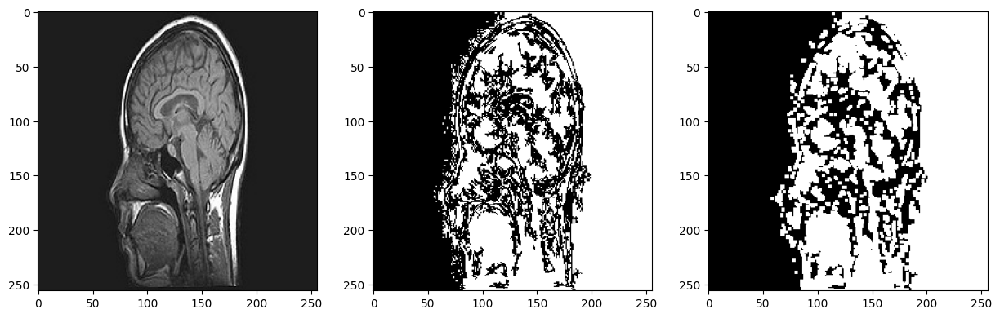

Condition: 30


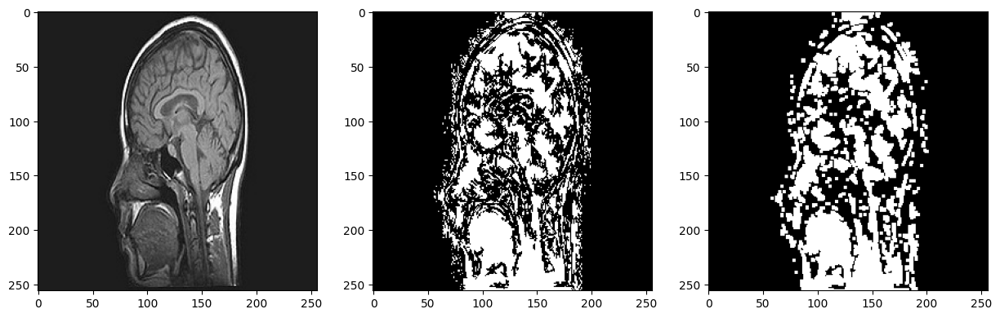

Condition: 40


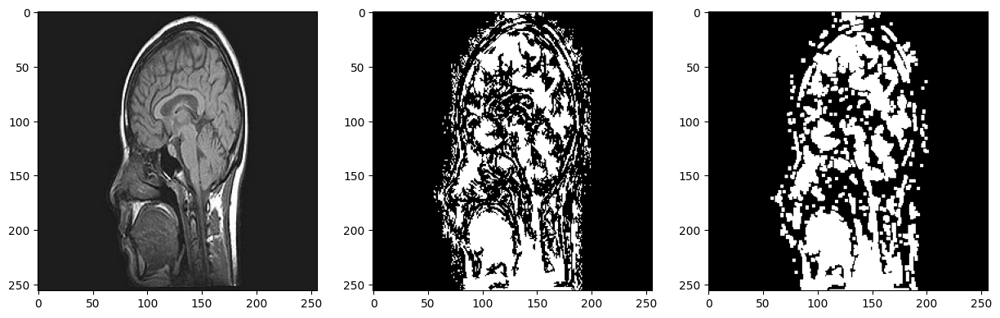

Condition: 50


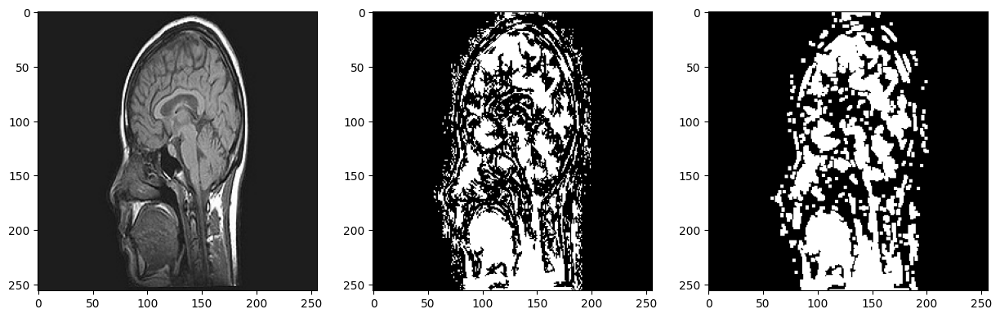

Condition: 60


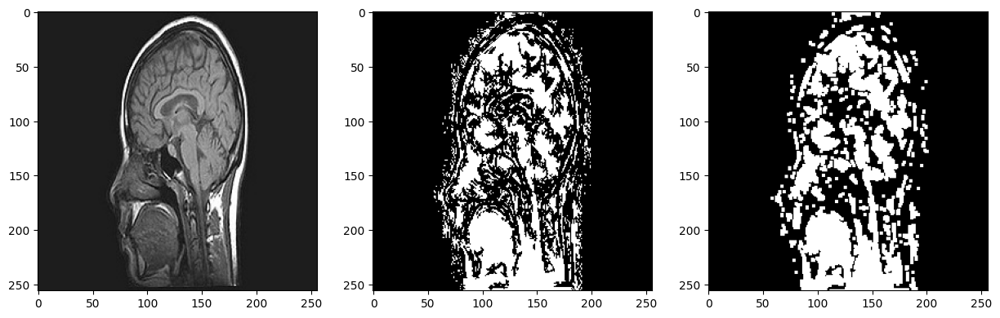

Condition: 70


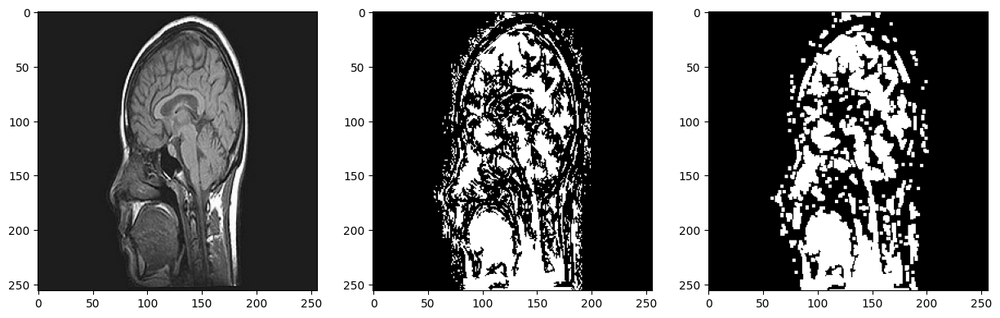

Condition: 80


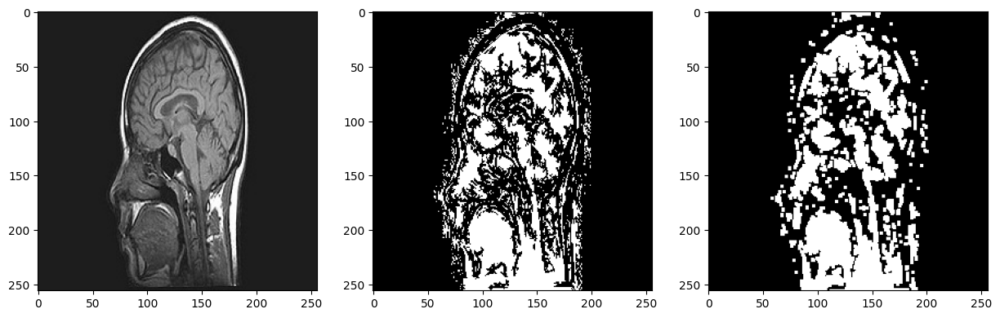

Condition: 90


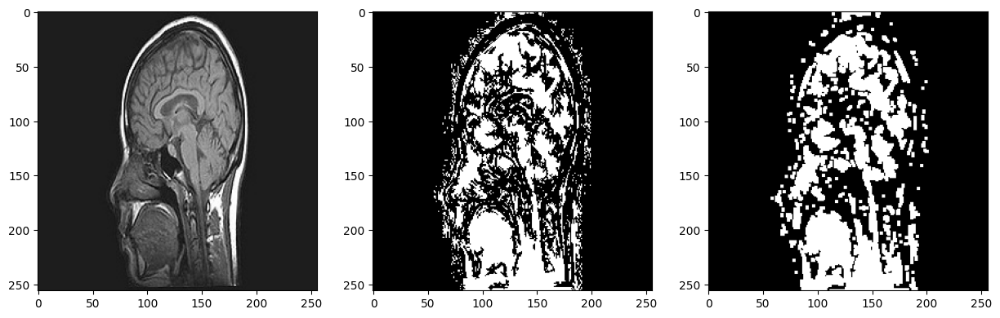

Condition: 100


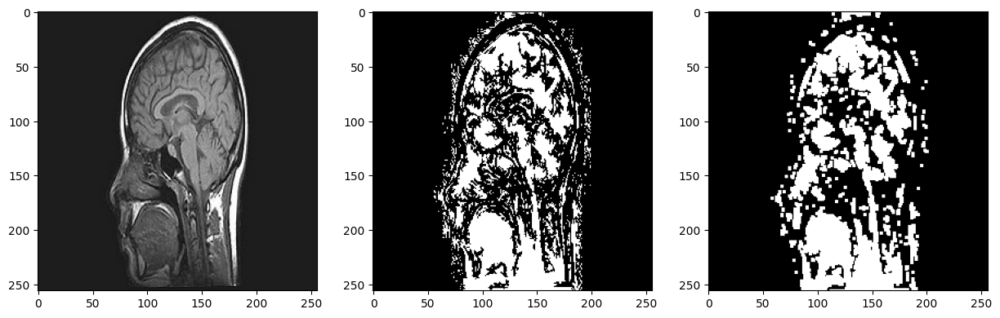

Condition: 110


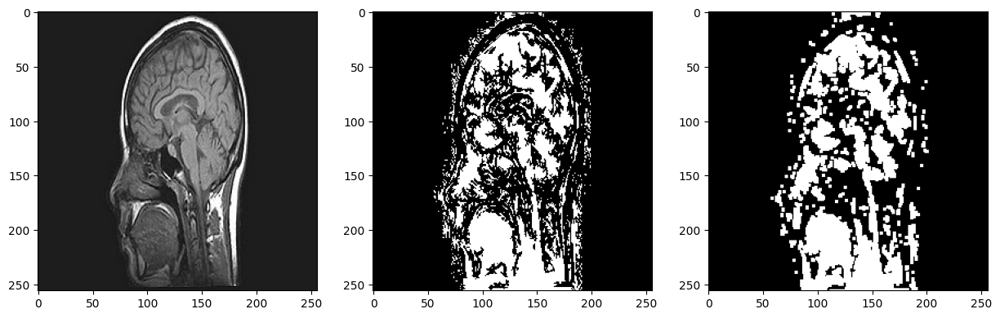

Condition: 120


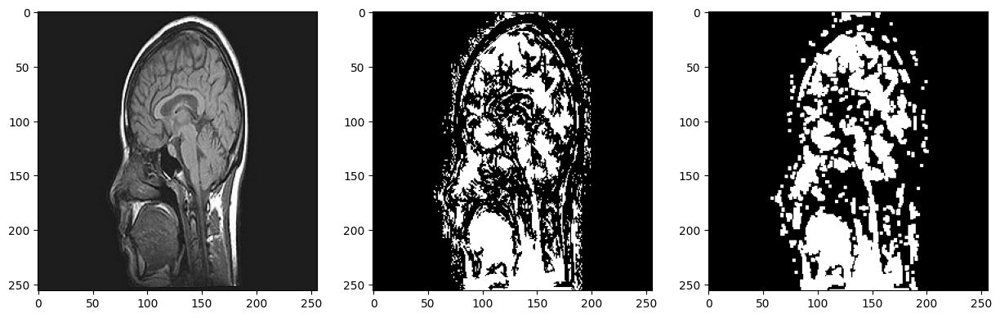

Condition: 130


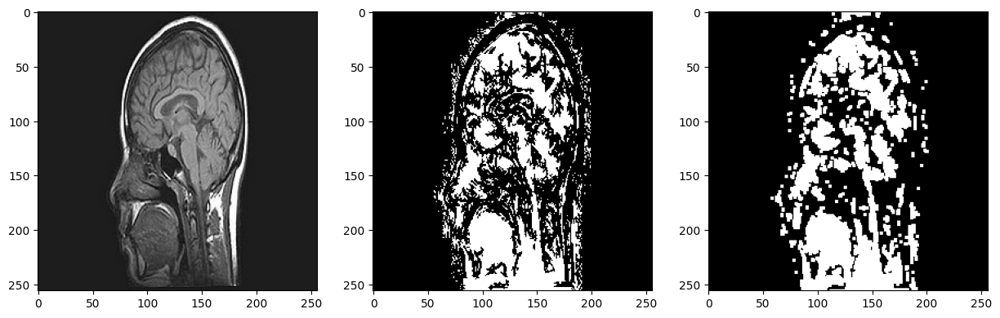

Condition: 140


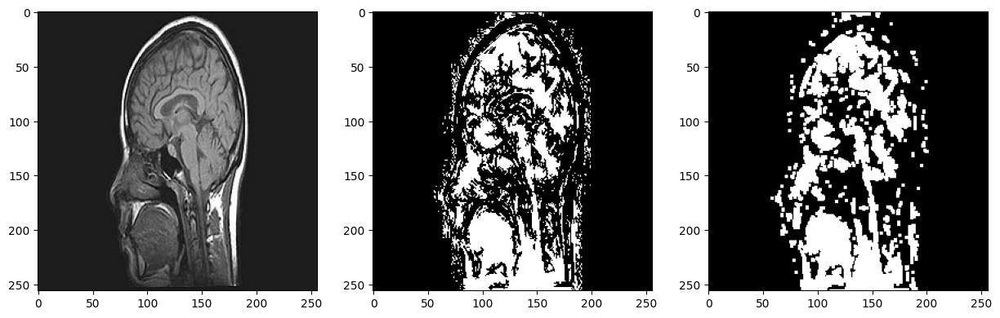

Condition: 150


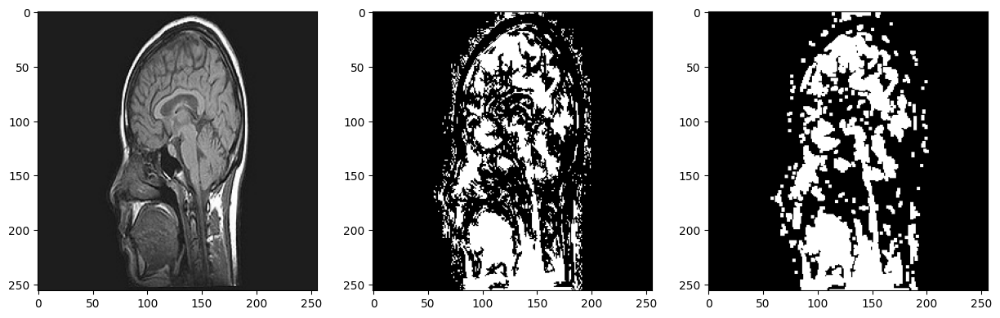

Condition: 160


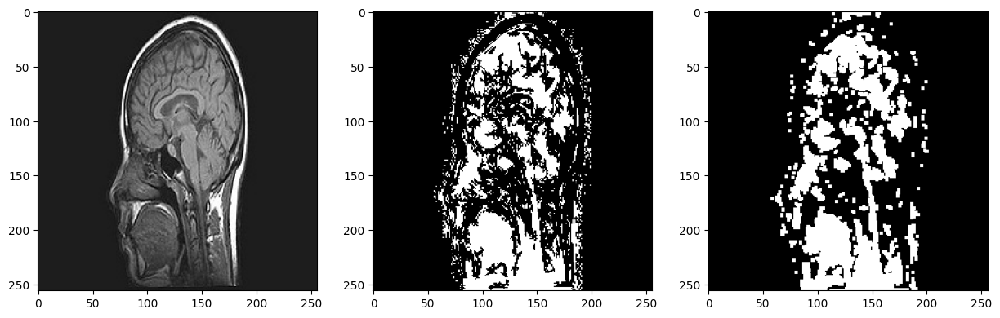

Condition: 170


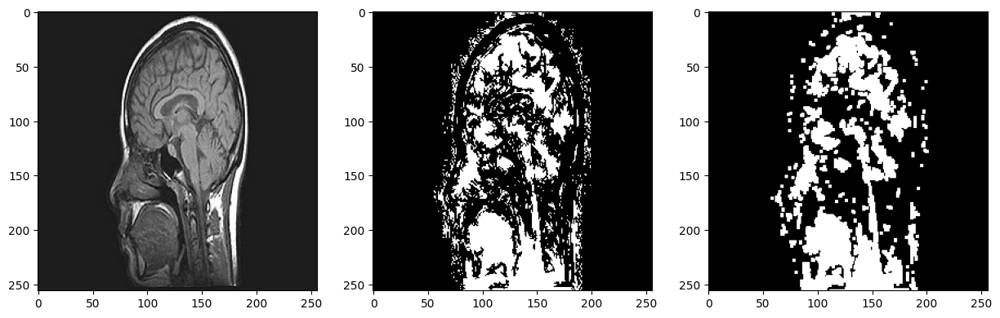

Condition: 180


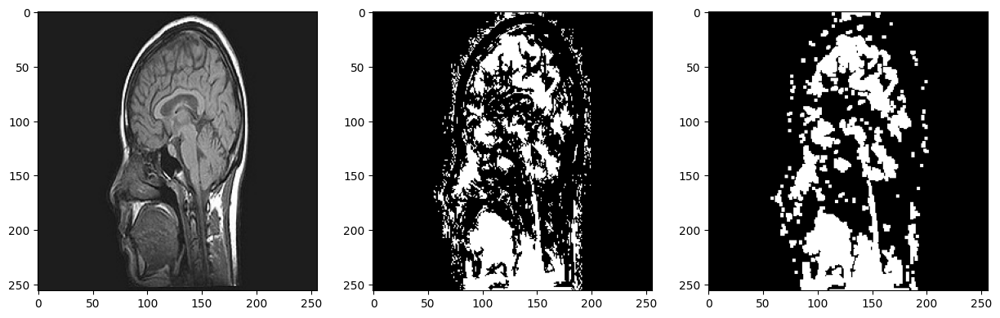

Condition: 190


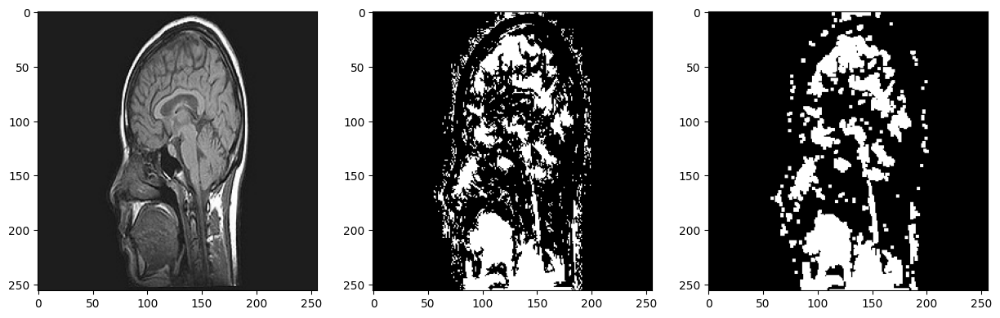

Condition: 200


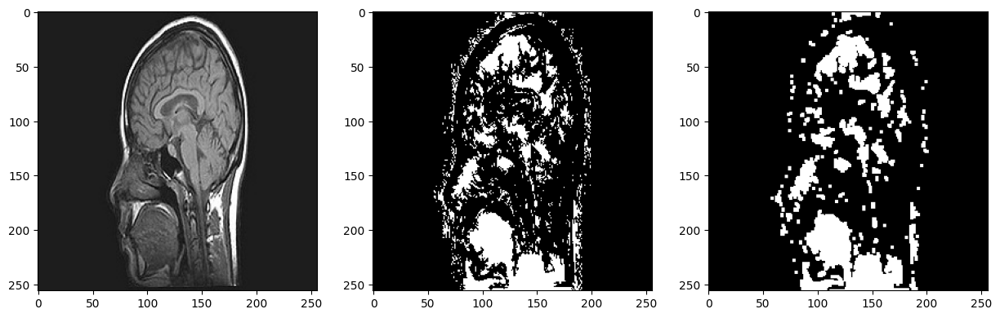

Condition: 210


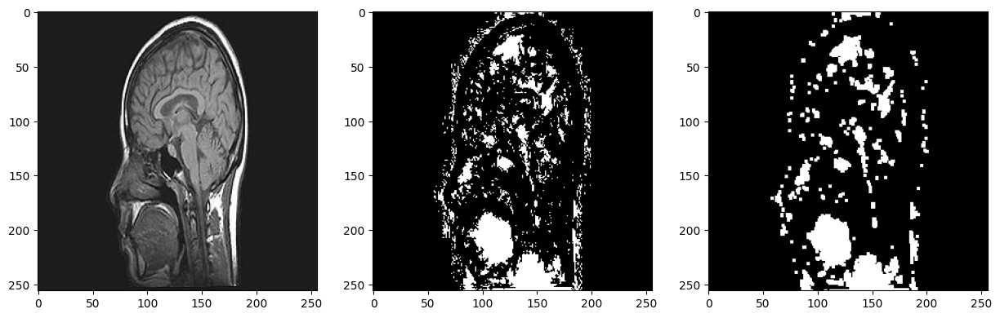

Condition: 220


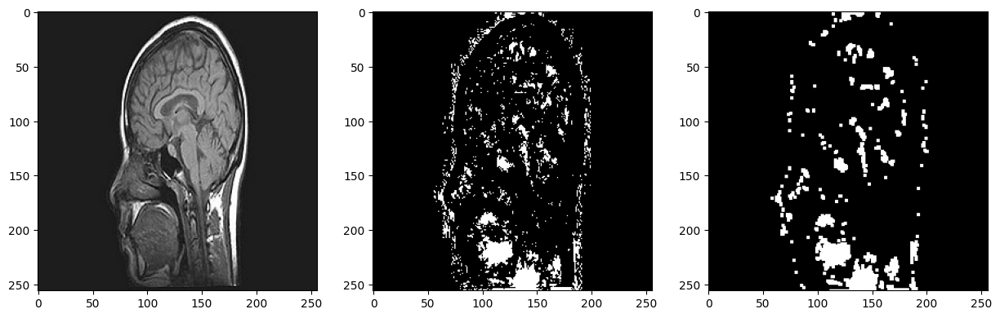

Condition: 230


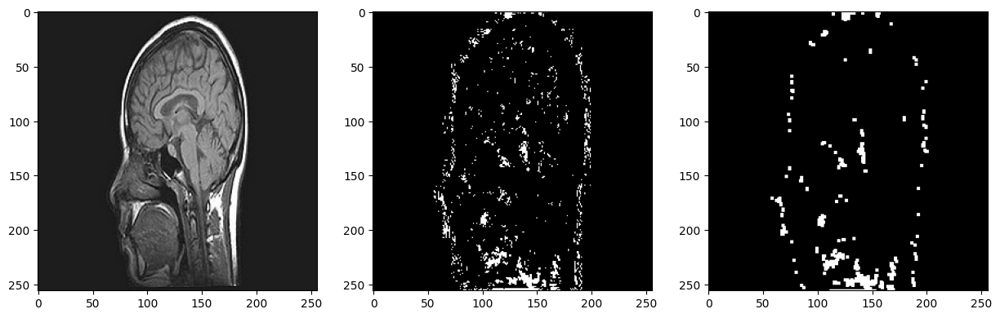

Condition: 240


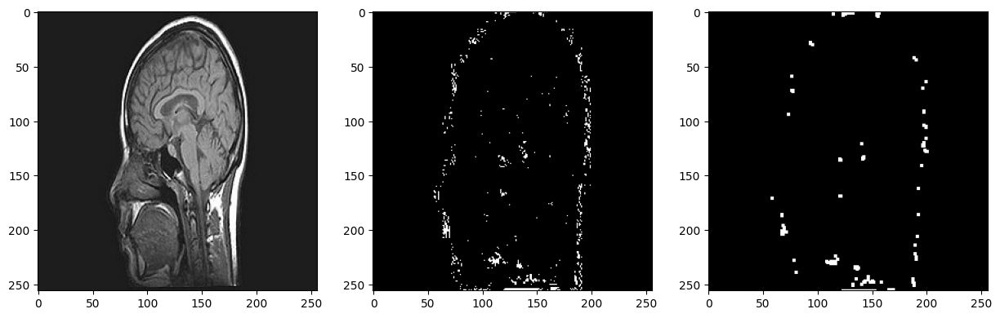

Condition: 250


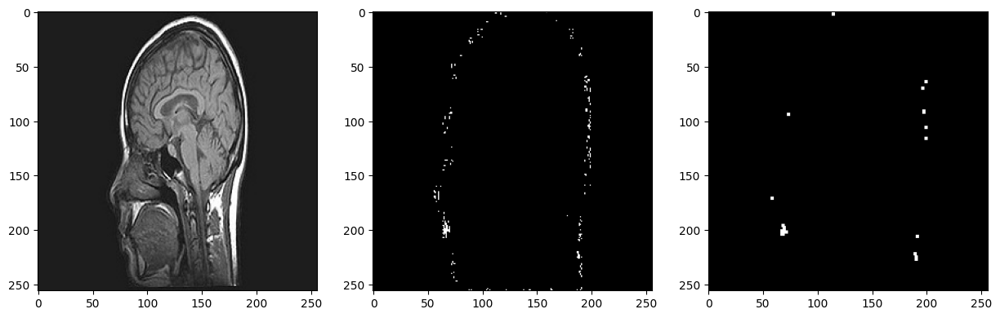

In [5]:
for condition in range(10, 260, 10):
    region = region_growth(mri, seed_points_mri, condition)
    kernel = np.ones((2,2),np.uint8)
    region_morph = cv2.erode(region, kernel, iterations = 1)
    region_morph = cv2.dilate(region_morph, kernel, iterations = 2)
    print('Condition: {}'.format(condition))
    plt.figure(figsize=(15,20))
    plt.subplot(131)
    plt.imshow(mri)
    plt.subplot(132)
    plt.imshow(region, cmap='gray')
    plt.subplot(133)
    plt.imshow(region_morph, cmap='gray')
    plt.show()

Now, we could see that the better result was obtained using the a condition of 100. And after that, we did morphological operations to improve the result.

<h2 style= "text-align: center"> FINAL RESULT (MRI) </h2>   

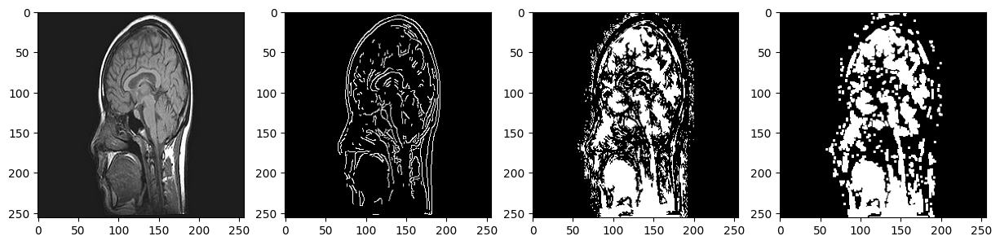

In [6]:
condition = 100
region = region_growth(mri, seed_points_mri, condition)
kernel = np.ones((2,2),np.uint8)
region_morph = cv2.erode(region, kernel, iterations = 1)
region_morph = cv2.dilate(region_morph, kernel, iterations = 2)

# Plot the original image, seeds image, segmented region and segmented region after morphological operations (erosion and dilation) 4 plots
plt.figure(figsize=(15,20))
plt.subplot(141)
plt.imshow(mri)
plt.subplot(142)
plt.imshow(seed_mri, cmap='gray')
plt.subplot(143)
plt.imshow(region, cmap='gray')
plt.subplot(144)
plt.imshow(region_morph, cmap='gray')
plt.show()

<h1 style= "text-align: center"> Apple</h1>

Load image:

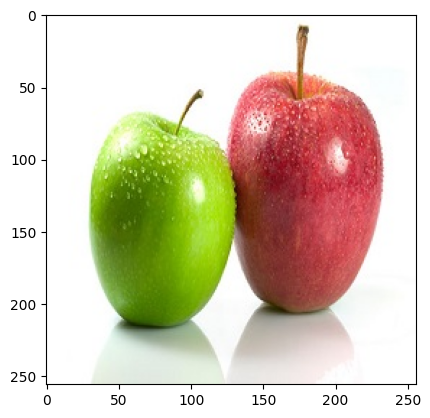

In [7]:
# Load the image
apple = cv2.imread('../Images/apple.jpg')

# Change color to RGB (from BGR)
apple = cv2.cvtColor(apple, cv2.COLOR_BGR2RGB)

plt.imshow(apple)

Seed selection: automatic (using borders-canny)

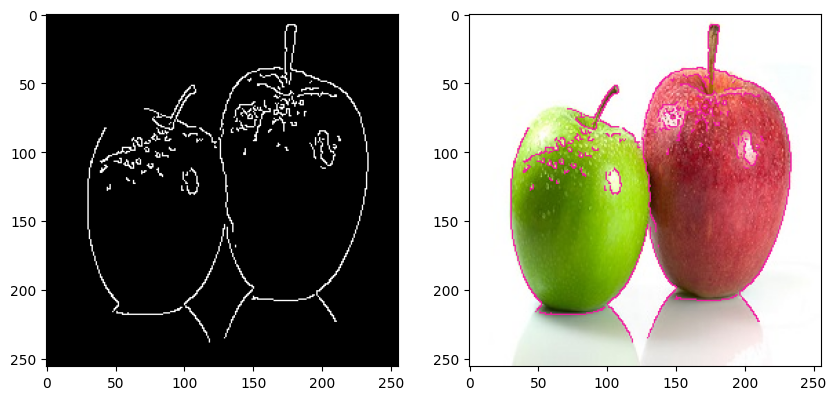

In [8]:
# Create seeds automatically
seed_points_apple = auto_seed_selection(apple)

# Fill the seeds with 1
seed_apple = np.zeros(apple.shape[:2])
# Set the value of the seeds to 1
for p in seed_points_apple:
    seed_apple[p[0], p[1]] = 1

# Shows the seeds in the image 
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(seed_apple, cmap='gray')
plt.subplot(122)
plt.imshow(show_seeds(apple, seed_points_apple))
plt.show()

RESULTS (ALL POSSIBLES RESULTS ARE SHOWN):

Condition: 0


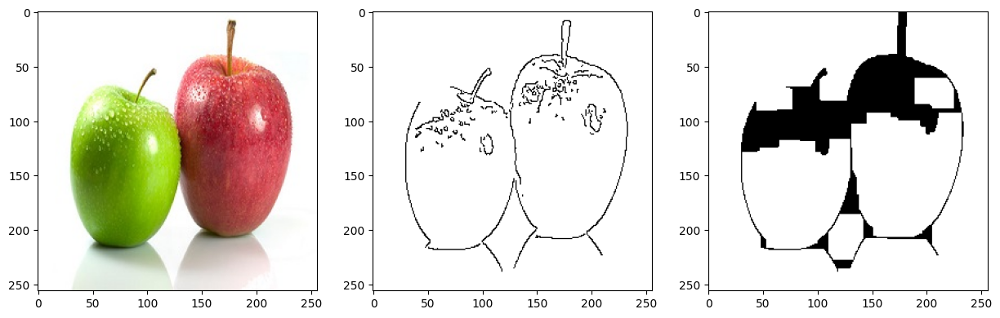

Condition: 10


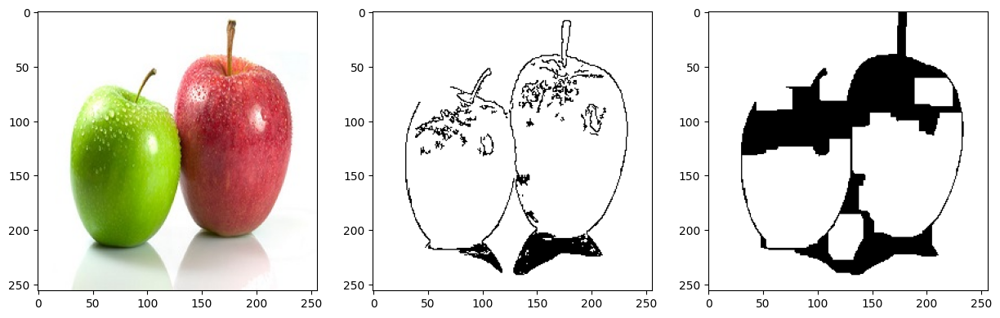

Condition: 20


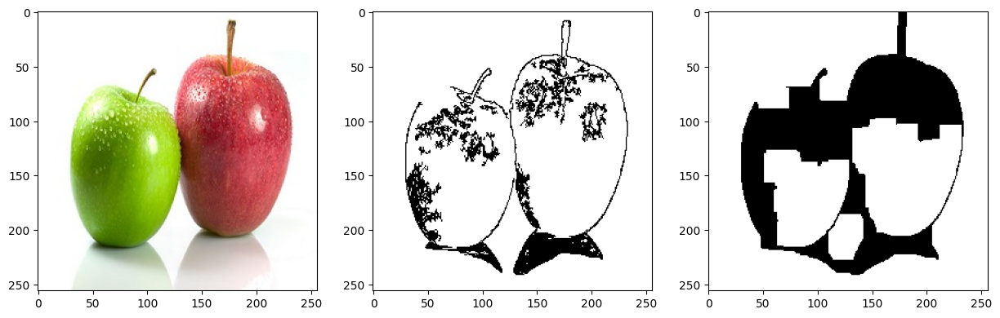

Condition: 30


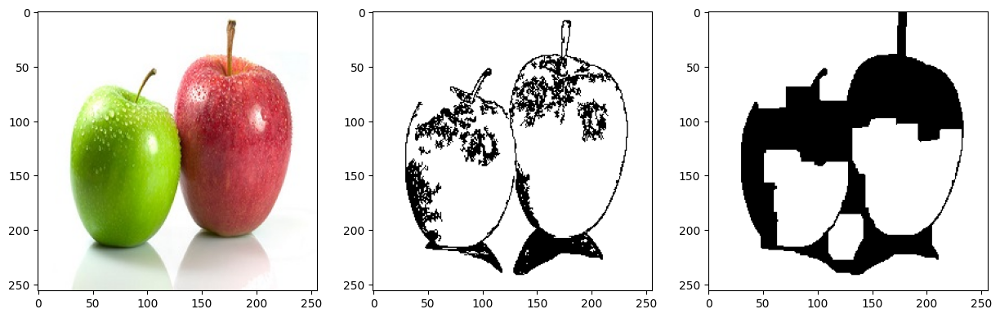

Condition: 40


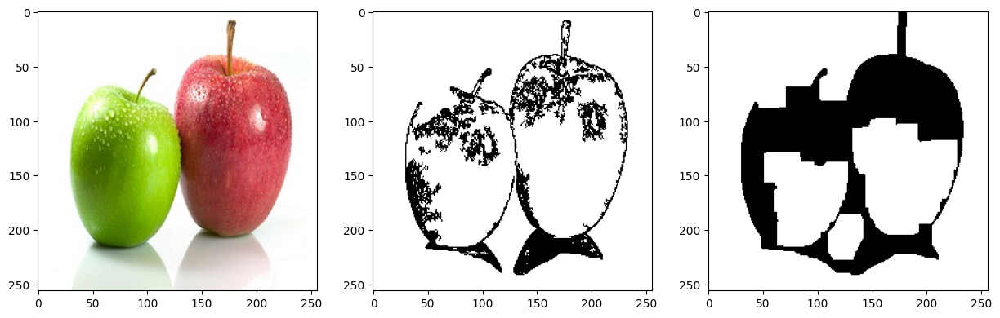

Condition: 50


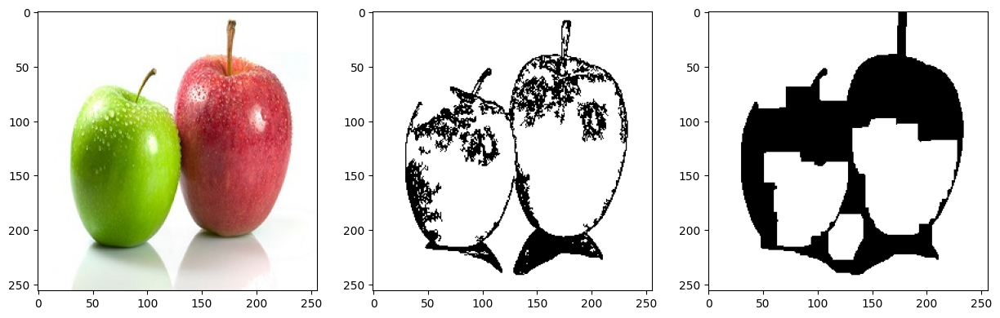

Condition: 60


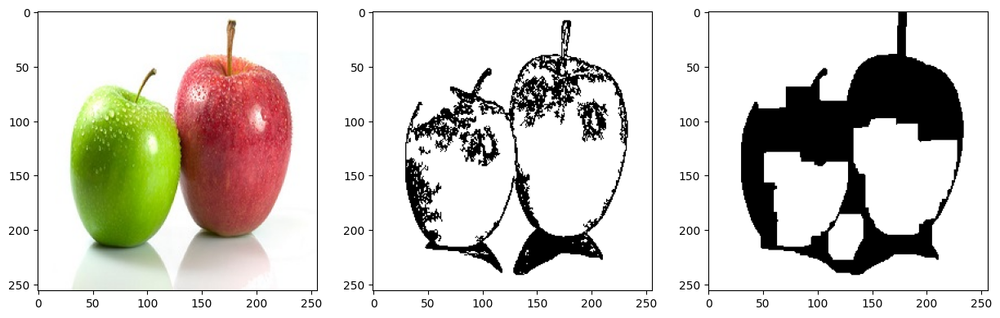

Condition: 70


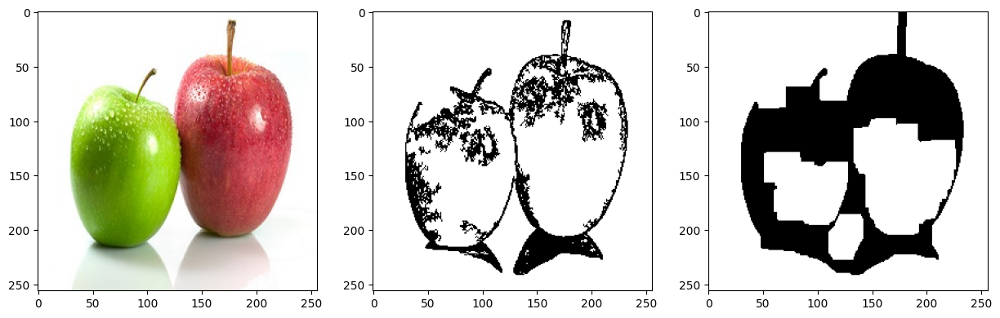

Condition: 80


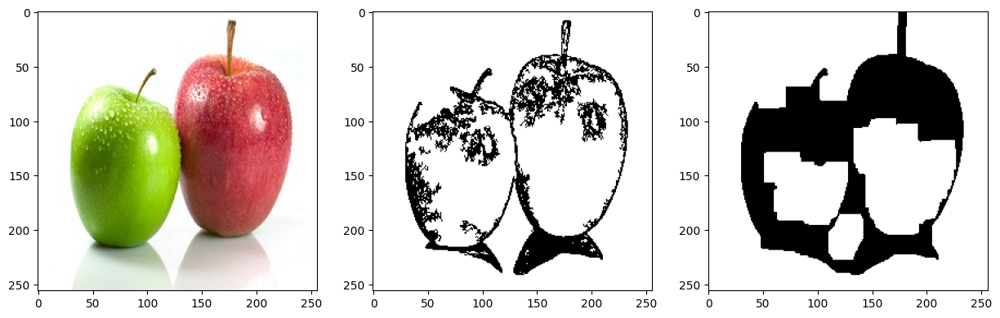

Condition: 90


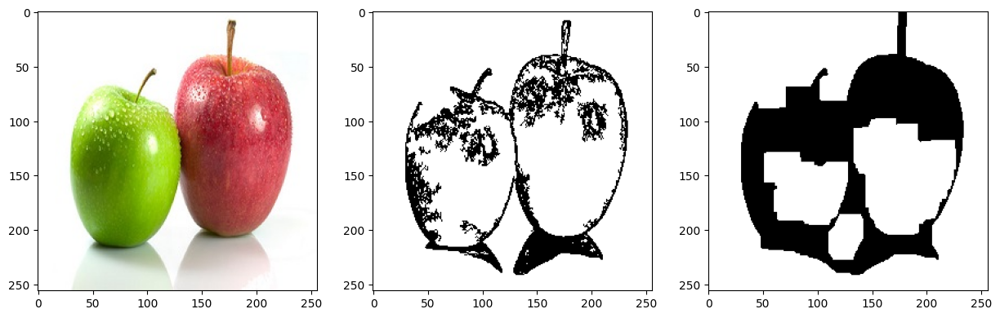

Condition: 100


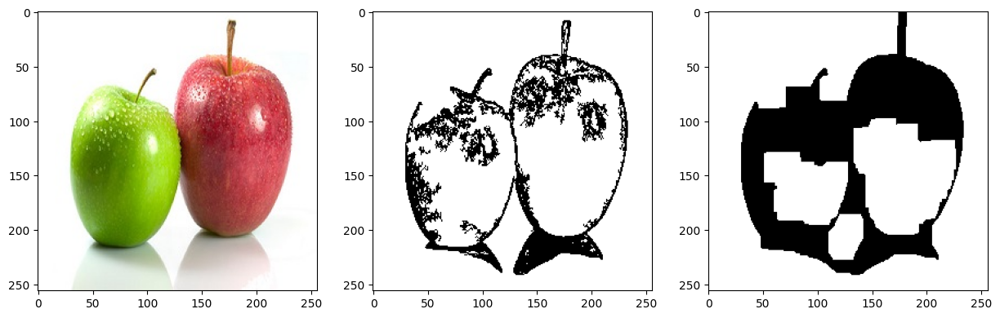

Condition: 110


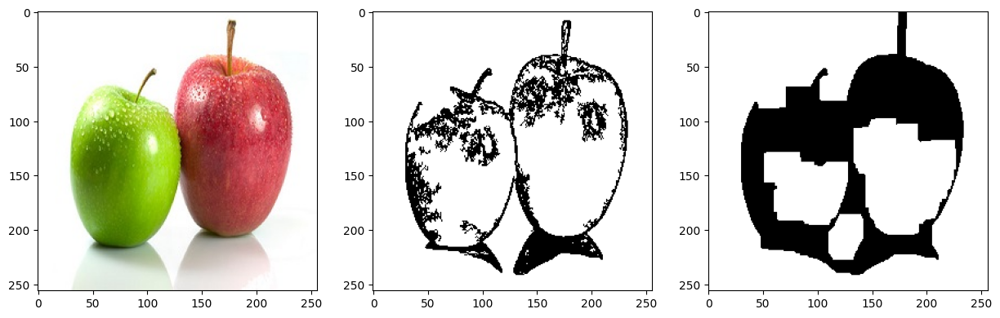

Condition: 120


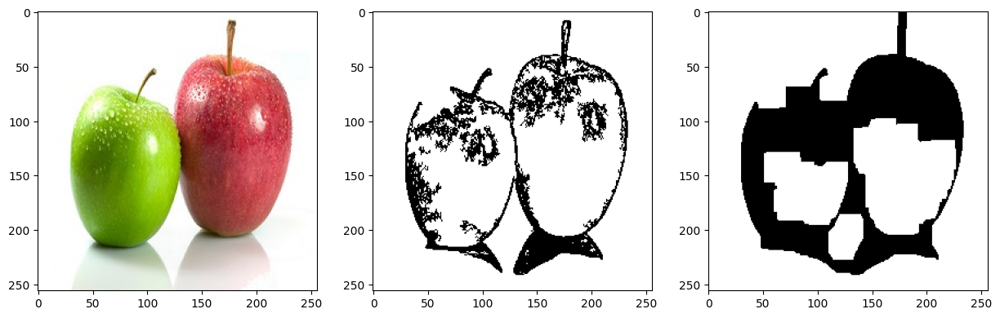

Condition: 130


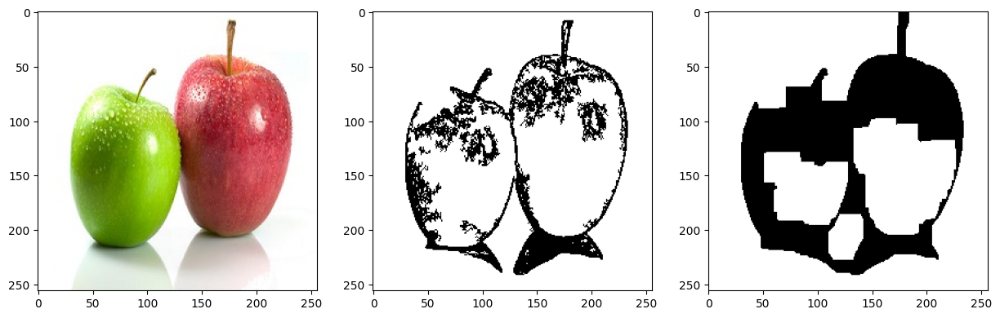

Condition: 140


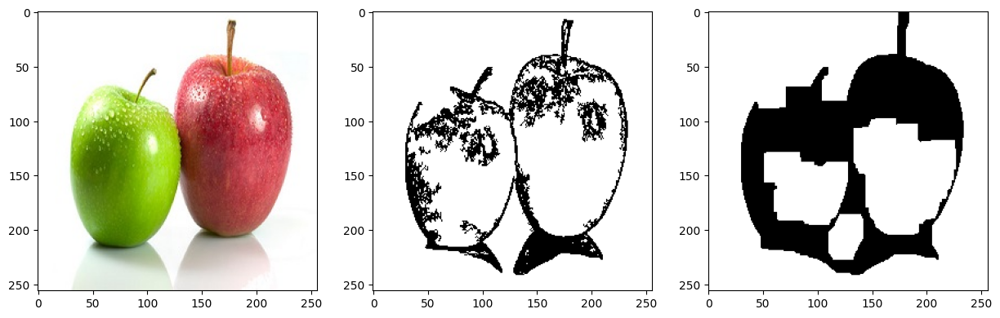

Condition: 150


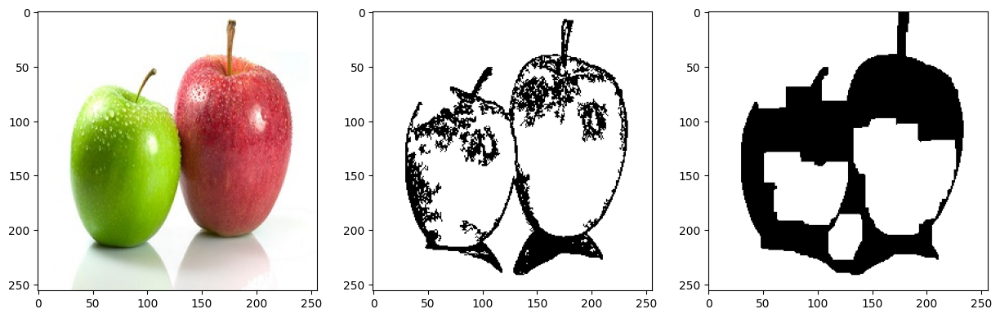

Condition: 160


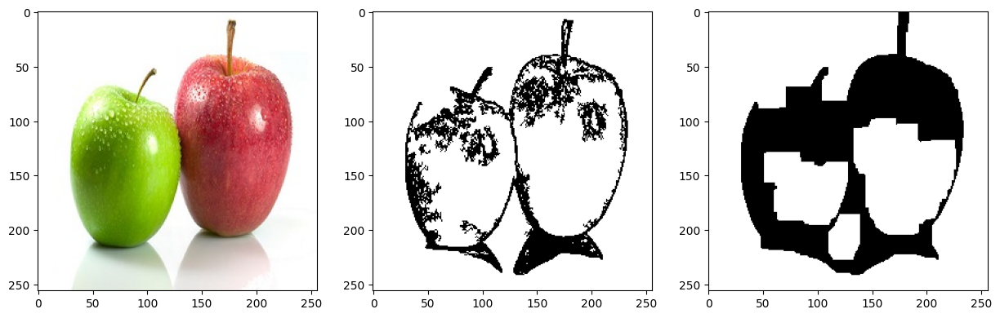

Condition: 170


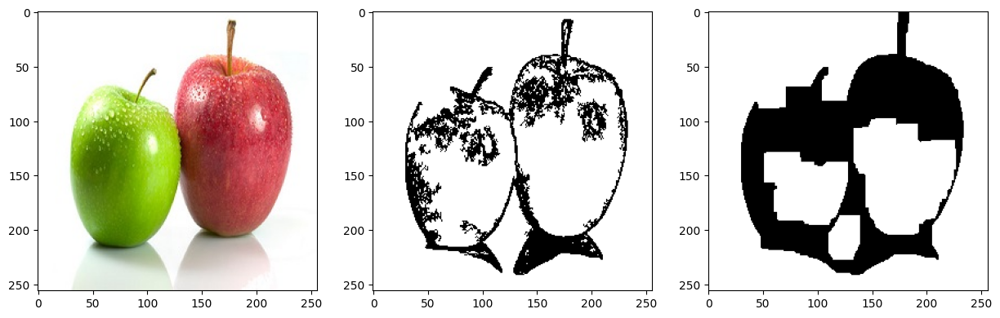

Condition: 180


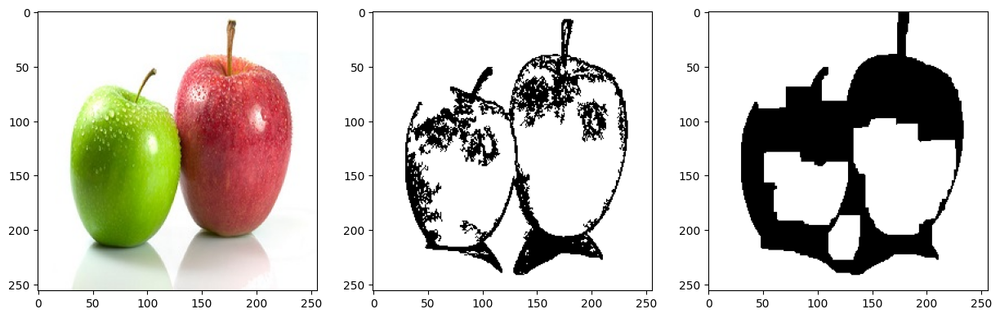

Condition: 190


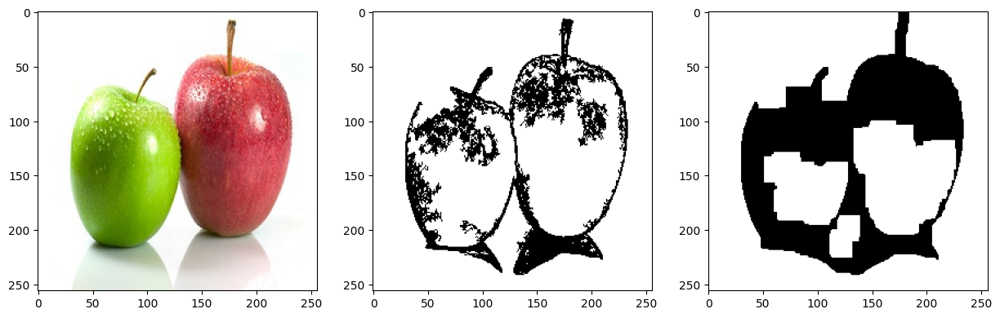

Condition: 200


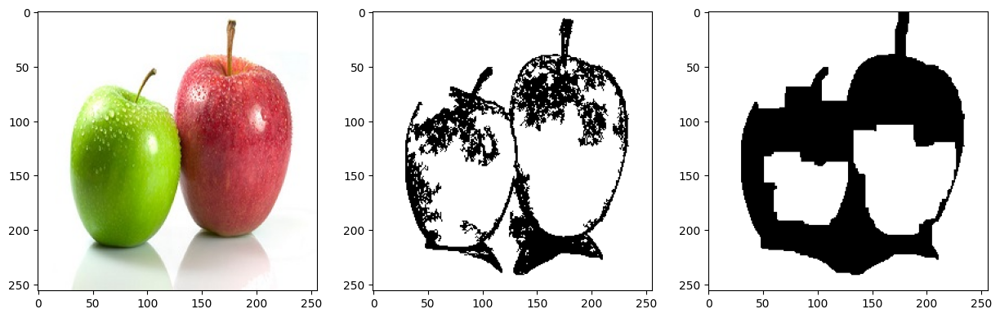

Condition: 210


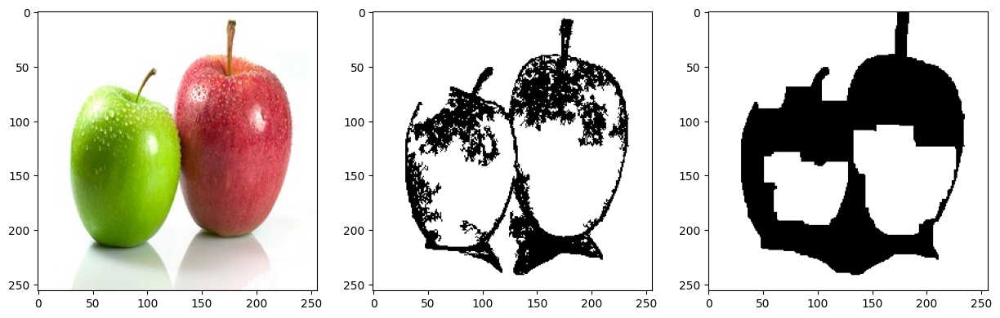

Condition: 220


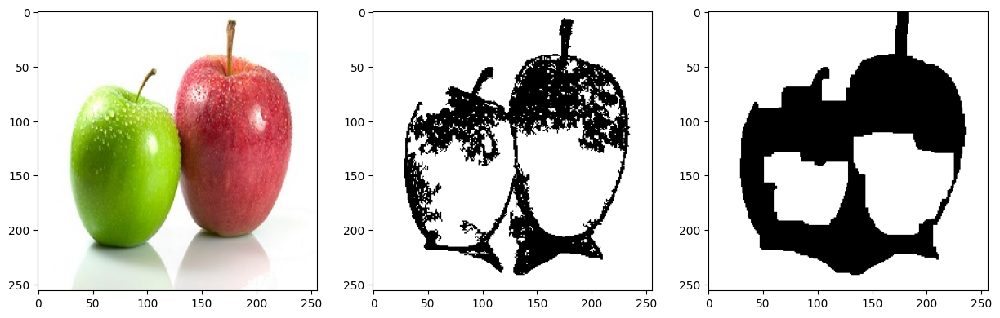

Condition: 230


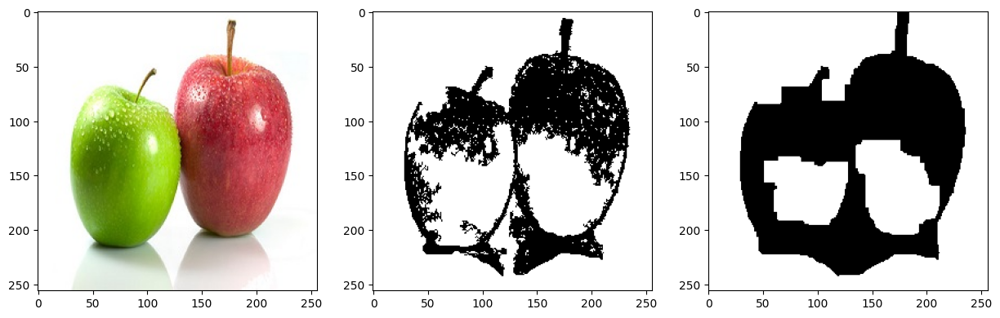

Condition: 240


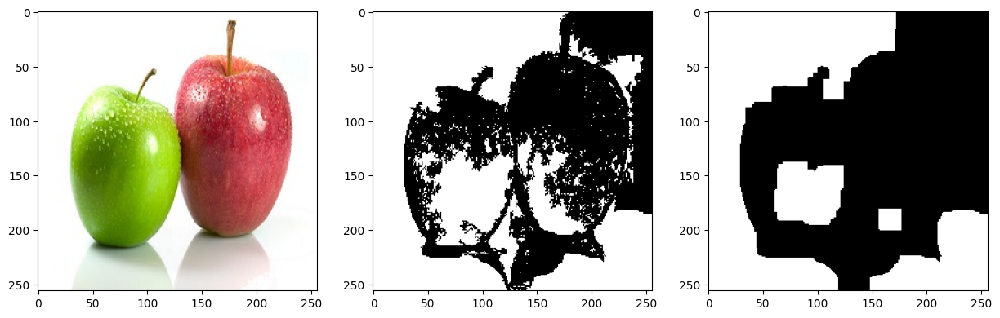

Condition: 250


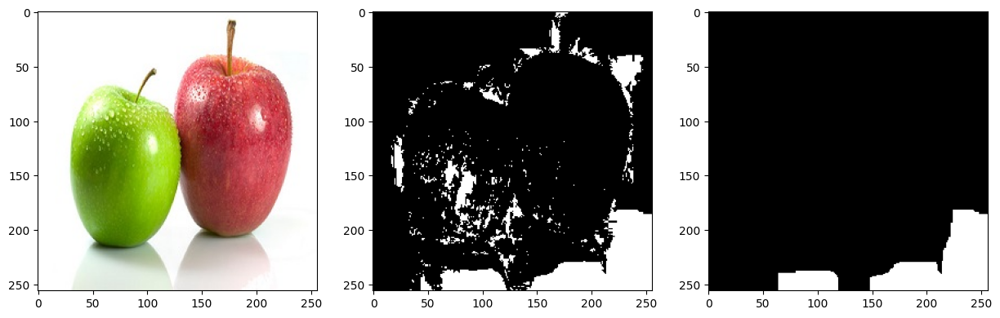

In [9]:
for condition in range(0, 260, 10):
    region = region_growth(apple, seed_points_apple, condition)
    kernel = np.ones((7,7),np.uint8)
    region_morph = cv2.erode(region , kernel, iterations = 3)
    region_morph = cv2.dilate(region_morph, kernel, iterations = 3)

    print('Condition: {}'.format(condition))
    plt.figure(figsize=(15,20))
    plt.subplot(131)
    plt.imshow(apple)
    plt.subplot(132)
    plt.imshow(region , cmap='gray')
    plt.subplot(133)
    plt.imshow(region_morph, cmap='gray')
    plt.show()

Now we can see that the best result was obtained using the condition of 230. And after that, we did morphological operations to improve the result.

<h2 style= "text-align: center"> FINAL RESULT (APPLE) </h2>   

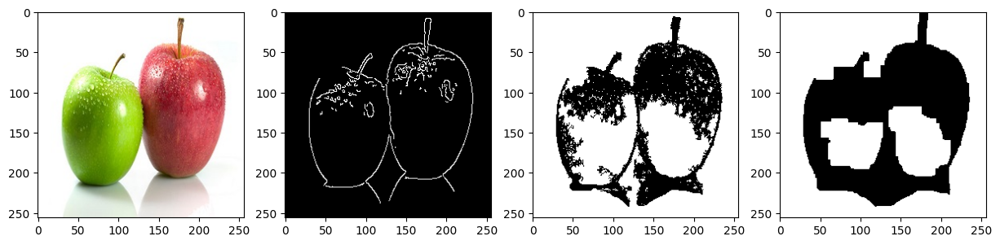

In [10]:
condition = 230
region = region_growth(apple, seed_points_apple, condition)
kernel = np.ones((7,7),np.uint8)
region_morph = cv2.erode(region , kernel, iterations = 3)
region_morph = cv2.dilate(region_morph, kernel, iterations = 3)

# Plot the original image, seeds image, segmented region and segmented region after morphological operations (erosion and dilation) 4 plots
plt.figure(figsize=(15,20))
plt.subplot(141)
plt.imshow(apple)
plt.subplot(142)
plt.imshow(seed_apple, cmap='gray')
plt.subplot(143)
plt.imshow(region , cmap='gray')
plt.subplot(144)
plt.imshow(region_morph, cmap='gray')
plt.show()